**Nama : Nydia Renli Sinaga**

**NIM  : 122140007**

 # **SOAL 1 : Rekaman dan Analisis Suara Multi-Level** #

In [1]:
# Setup & Instalasi - Pastikan semua paket terinstal (opsional), disarankan untuk diinstal dari terminal
# !pip install -q librosa soundfile numpy scipy matplotlib ipython

# Import semua library yang dibutuhkan
import librosa
import soundfile as sf
import numpy as np
import scipy
import matplotlib.pyplot as plt
from IPython.display import Audio
import os

# Tampilkan versi pustaka untuk memastikan kompatibilitas
print("Versi pustaka yang digunakan:")
print(f"Librosa: {librosa.__version__}")
print(f"NumPy: {np.__version__}")
print(f"SciPy: {scipy.__version__}")
print(f"Matplotlib: {plt.matplotlib.__version__}")
print("✅ Semua pustaka berhasil dimuat!")

Versi pustaka yang digunakan:
Librosa: 0.11.0
NumPy: 2.2.5
SciPy: 1.16.0
Matplotlib: 3.10.1
✅ Semua pustaka berhasil dimuat!


C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\871849201.py:31: UserWarning: Glyph 127925 (\N{MUSICAL NOTE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


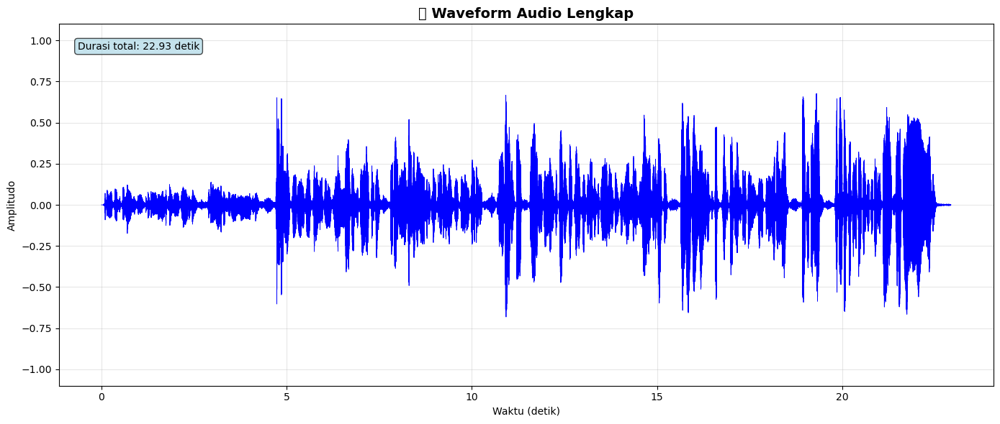

✅ Waveform berhasil ditampilkan!
📊 Total sampel yang diplot: 1,100,800
🎧 Durasi total audio: 22.93 detik
🎚️ Sample rate: 48000 Hz


In [8]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display

# === 1. Load file audio ===
# Ganti 'Rekaman dan Analisis Suara Multi-Level.wav' dengan nama file audio kamu
audio_path = 'Rekaman dan Analisis Suara Multi-Level.wav'
y, sr = librosa.load(audio_path, sr=None)  # sr=None agar sample rate asli dipertahankan

# === 2. Buat vektor waktu ===
t = np.linspace(0, len(y)/sr, len(y))

# === 3. Setup plot ===
fig, ax = plt.subplots(figsize=(14, 6))

# --- Plot Waveform Lengkap ---
ax.plot(t, y, color='blue', linewidth=0.6)
ax.set_title('🎵 Waveform Audio Lengkap', fontsize=14, fontweight='bold')
ax.set_xlabel('Waktu (detik)')
ax.set_ylabel('Amplitudo')
ax.grid(True, alpha=0.3)
ax.set_ylim([-1.1, 1.1])

# Tambahkan informasi durasi
duration_text = f'Durasi total: {len(y)/sr:.2f} detik'
ax.text(0.02, 0.93, duration_text, transform=ax.transAxes,
        bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))

# --- Layout rapi ---
plt.tight_layout()
plt.show()

# --- Info tambahan di terminal ---
print("✅ Waveform berhasil ditampilkan!")
print(f"📊 Total sampel yang diplot: {len(y):,}")
print(f"🎧 Durasi total audio: {len(y)/sr:.2f} detik")
print(f"🎚️ Sample rate: {sr} Hz")


C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\2400879995.py:31: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
c:\Users\Asus\miniconda3\envs\multimedia\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


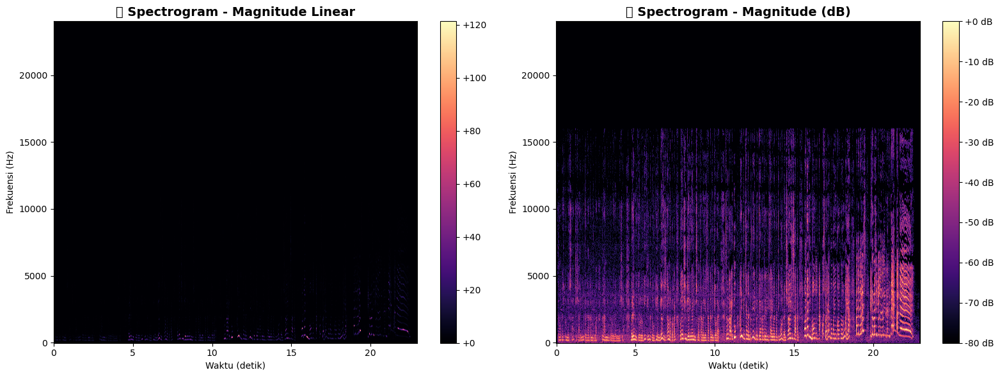

📋 INFORMASI STFT
🔢 Ukuran FFT: 1024
👣 Hop length: 256
🪟 Window function: hann
📊 Shape magnitude: (513, 4301)
⏱️ Resolusi waktu: 5.3 ms per frame
🎵 Resolusi frekuensi: 46.9 Hz per bin
📈 Range magnitude (dB): -80.0 - 0.0


In [10]:
# Hitung dan Plot Spectrogram (STFT)
# Parameter STFT
n_fft = 1024        # Ukuran FFT window
hop_length = 256    # Langkah antar frame
window = 'hann'     # Jenis window function

# Hitung STFT
D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length, window=window)
magnitude = np.abs(D)
magnitude_db = librosa.amplitude_to_db(magnitude, ref=np.max)

# Setup plot dengan 2 subplot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Magnitude Spectrogram (Linear)
img1 = librosa.display.specshow(magnitude, x_axis='time', y_axis='hz', 
                               sr=sr, hop_length=hop_length, ax=ax1)
ax1.set_title('📊 Spectrogram - Magnitude Linear', fontsize=14, fontweight='bold')
ax1.set_xlabel('Waktu (detik)')
ax1.set_ylabel('Frekuensi (Hz)')
plt.colorbar(img1, ax=ax1, format='%+2.0f')

# Plot 2: Magnitude Spectrogram (Log dB)
img2 = librosa.display.specshow(magnitude_db, x_axis='time', y_axis='hz',
                               sr=sr, hop_length=hop_length, ax=ax2)
ax2.set_title('📊 Spectrogram - Magnitude (dB)', fontsize=14, fontweight='bold')  
ax2.set_xlabel('Waktu (detik)')
ax2.set_ylabel('Frekuensi (Hz)')
plt.colorbar(img2, ax=ax2, format='%+2.0f dB')

plt.tight_layout()
plt.show()

# Informasi STFT
print("📋 INFORMASI STFT")
print("=" * 40)
print(f"🔢 Ukuran FFT: {n_fft}")
print(f"👣 Hop length: {hop_length}")
print(f"🪟 Window function: {window}")
print(f"📊 Shape magnitude: {magnitude.shape}")
print(f"⏱️ Resolusi waktu: {hop_length/sr*1000:.1f} ms per frame")
print(f"🎵 Resolusi frekuensi: {sr/n_fft:.1f} Hz per bin")
print(f"📈 Range magnitude (dB): {magnitude_db.min():.1f} - {magnitude_db.max():.1f}")

**Penjelasan singkat mengenai hasil visualisasi**

1. Waveform : menampilkan perubahan amplitudo sinyal selama 22.9 detik, dari gambar juga terlihat bahwa suaea mulai pelan di awal, kemudian bertambah besar amplitudonya di akhir

2. Spectogram : menampilkan pola warna yang lebih terang dibawah 0-5000 Hz yang berarti sebagian besar energi suaranya berada di frekuensi yang rendah dan menengah, dan pola bergelombang dan berulang menunjukkan perubahan nada disetiap suara saya

🔄 RESAMPLING DEMONSTRATION
📊 Audio asli: 48,000 Hz, 1,100,800 samples
🎯 Target sample rate: 16,000 Hz
📉 Rasio downsampling: 0.3333

📊 HASIL RESAMPLING:
  Librosa: 366,934 samples
  SciPy:   366,933 samples
  Durasi:  22.93 detik


C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\841917063.py:57: UserWarning: Glyph 127925 (\N{MUSICAL NOTE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\841917063.py:57: UserWarning: Glyph 128260 (\N{ANTICLOCKWISE DOWNWARDS AND UPWARDS OPEN CIRCLE ARROWS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


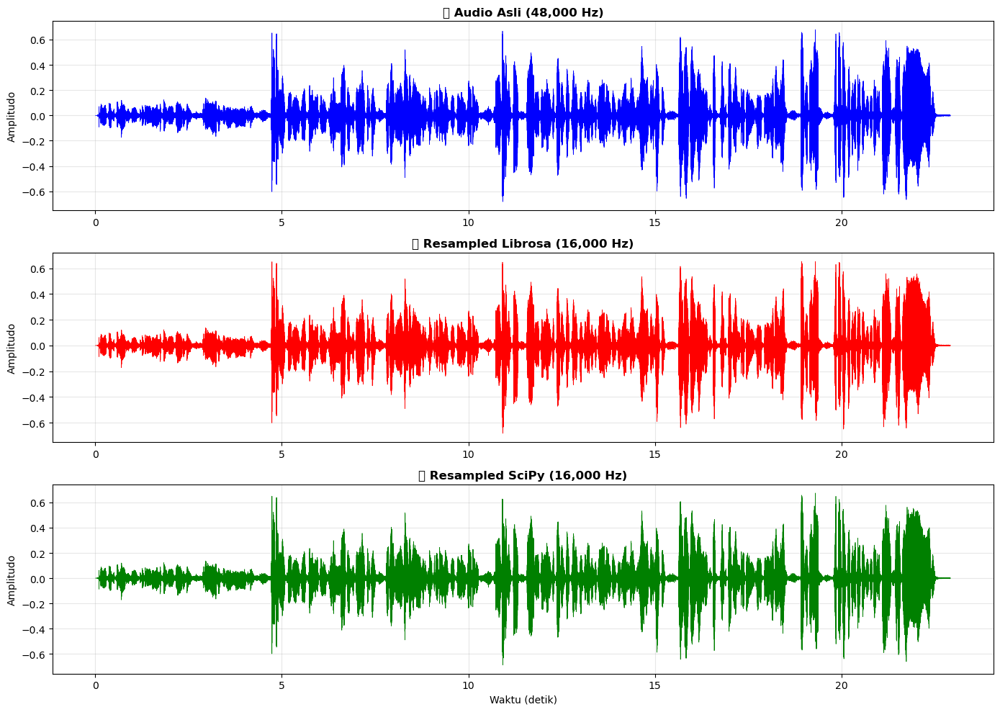

🔊 AUDIO COMPARISON:
🎧 Original Audio:


🎧 Resampled Audio (Librosa):



✅ Resampling selesai! Audio tersimpan dengan sample rate 16,000 Hz sebagai 'Rekaman_Resampled_16k.wav'


In [13]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal
from IPython.display import Audio, display

# === 1. Load audio ===
audio_path = "Rekaman dan Analisis Suara Multi-Level.wav"
y, sr = librosa.load(audio_path, sr=None)  # load dengan sample rate asli (48000 Hz)
print("🔄 RESAMPLING DEMONSTRATION")
print("=" * 50)
print(f"📊 Audio asli: {sr:,} Hz, {len(y):,} samples")

# === 2. Tentukan target sample rate ===
target_sr = 16000

# === 3. Method 1: Librosa resampling (anti-aliasing) ===
y_resampled_librosa = librosa.resample(y, orig_sr=sr, target_sr=target_sr)

# === 4. Method 2: SciPy resampling (untuk perbandingan) ===
resample_ratio = target_sr / sr
num_samples_new = int(len(y) * resample_ratio)
y_resampled_scipy = scipy.signal.resample(y, num_samples_new)

print(f"🎯 Target sample rate: {target_sr:,} Hz")
print(f"📉 Rasio downsampling: {resample_ratio:.4f}\n")
print("📊 HASIL RESAMPLING:")
print(f"  Librosa: {len(y_resampled_librosa):,} samples")
print(f"  SciPy:   {len(y_resampled_scipy):,} samples")
print(f"  Durasi:  {len(y_resampled_librosa)/target_sr:.2f} detik")

# === 5. Visualisasi perbandingan waveform ===
fig, axes = plt.subplots(3, 1, figsize=(14, 10))

# Plot 1: Audio Asli
t_orig = np.linspace(0, len(y)/sr, len(y))
axes[0].plot(t_orig, y, color='blue', linewidth=0.5)
axes[0].set_title(f'🎵 Audio Asli ({sr:,} Hz)', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Amplitudo')
axes[0].grid(True, alpha=0.3)

# Plot 2: Hasil Resampling (Librosa)
t_resamp = np.linspace(0, len(y_resampled_librosa)/target_sr, len(y_resampled_librosa))
axes[1].plot(t_resamp, y_resampled_librosa, color='red', linewidth=0.5)
axes[1].set_title(f'🔄 Resampled Librosa ({target_sr:,} Hz)', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Amplitudo')
axes[1].grid(True, alpha=0.3)

# Plot 3: Hasil Resampling (SciPy)
t_scipy = np.linspace(0, len(y_resampled_scipy)/target_sr, len(y_resampled_scipy))
axes[2].plot(t_scipy, y_resampled_scipy, color='green', linewidth=0.5)
axes[2].set_title(f'🔄 Resampled SciPy ({target_sr:,} Hz)', fontsize=12, fontweight='bold')
axes[2].set_xlabel('Waktu (detik)')
axes[2].set_ylabel('Amplitudo')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# === 6. Playback Audio (opsional, bisa dijalankan di Jupyter Notebook) ===
print("🔊 AUDIO COMPARISON:")
print("🎧 Original Audio:")
display(Audio(y, rate=sr))
print("🎧 Resampled Audio (Librosa):")
display(Audio(y_resampled_librosa, rate=target_sr))

# === 7. Simpan hasil resampling (jika ingin digunakan lagi) ===
import soundfile as sf
sf.write("Rekaman_Resampled_16k.wav", y_resampled_librosa, target_sr)

print(f"\n✅ Resampling selesai! Audio tersimpan dengan sample rate {target_sr:,} Hz sebagai 'Rekaman_Resampled_16k.wav'")


# **SOAL 2 : Noise Reduction dengan Filtering** #

🎛️ IMPLEMENTASI FILTER DASAR
🎵 Menggunakan audio: 505,856 samples, 48,000 Hz
✅ Low-pass filter applied: cutoff = 1000 Hz
✅ High-pass filter applied: cutoff = 500 Hz
✅ Band-pass filter applied: 500-2000 Hz


C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\68672332.py:77: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\68672332.py:77: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
c:\Users\Asus\miniconda3\envs\multimedia\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


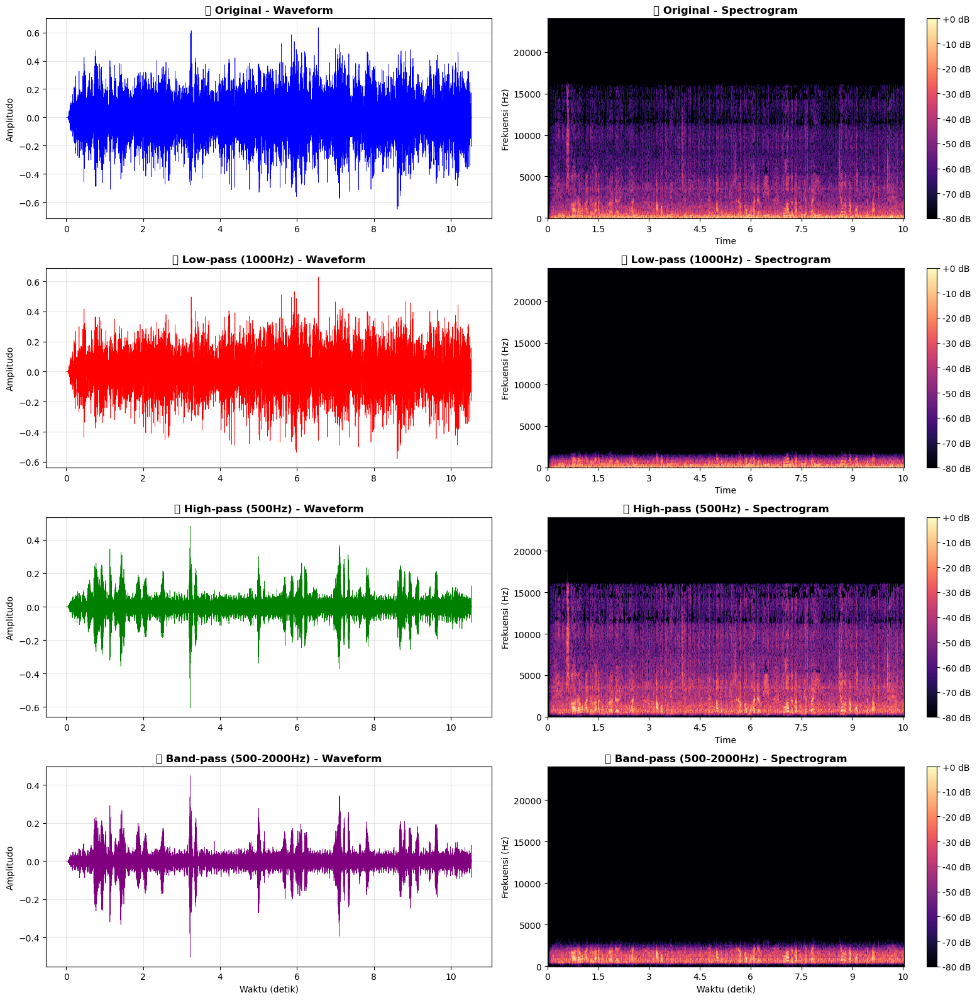

🔊 AUDIO COMPARISON:
Original Audio:


Low-pass Filtered (1000Hz cutoff):


High-pass Filtered (500Hz cutoff):


Band-pass Filtered (500-2000Hz):



✅ Filter berhasil diterapkan!
📊 Audio tersimpan untuk analisis lebih lanjut

💾 Semua hasil filter berhasil disimpan!
📂 File yang tersimpan:
- Noise_LowPass_1000Hz.wav
- Noise_HighPass_500Hz.wav
- Noise_BandPass_500_2000Hz.wav


In [ ]:
# Hands-on: Low-pass dan High-pass Filter

print("🎛️ IMPLEMENTASI FILTER DASAR")
print("=" * 50)

y, sr = librosa.load("Noise Reduction dengan Filtering.dat.wav", sr=48000)
audio_to_filter = y
sample_rate = sr

print(f"🎵 Menggunakan audio: {len(audio_to_filter):,} samples, {sample_rate:,} Hz")

# Parameter filter
lowpass_cutoff = 1000   # Hz - Low-pass cutoff
highpass_cutoff = 500  # Hz - High-pass cutoff
filter_order = 4        # Order filter (semakin tinggi = semakin tajam)

# 1. LOW-PASS FILTER (High-cut)
# Desain filter menggunakan scipy.signal.butter
nyquist = sample_rate / 2
lowpass_normalized = lowpass_cutoff / nyquist

# Membuat koefisien filter Butterworth
b_low, a_low = scipy.signal.butter(filter_order, lowpass_normalized, btype='low')

# Aplikasikan filter
audio_lowpass = scipy.signal.filtfilt(b_low, a_low, audio_to_filter)

print(f"✅ Low-pass filter applied: cutoff = {lowpass_cutoff} Hz")

# 2. HIGH-PASS FILTER (Low-cut)
highpass_normalized = highpass_cutoff / nyquist
b_high, a_high = scipy.signal.butter(filter_order, highpass_normalized, btype='high')
audio_highpass = scipy.signal.filtfilt(b_high, a_high, audio_to_filter)

print(f"✅ High-pass filter applied: cutoff = {highpass_cutoff} Hz")

# 3. BAND-PASS FILTER (kombinasi low dan high)
bandpass_low = 500   # Hz
bandpass_high = 2000 # Hz
bandpass_normalized = [bandpass_low / nyquist, bandpass_high / nyquist]
b_band, a_band = scipy.signal.butter(filter_order, bandpass_normalized, btype='band')
audio_bandpass = scipy.signal.filtfilt(b_band, a_band, audio_to_filter)

print(f"✅ Band-pass filter applied: {bandpass_low}-{bandpass_high} Hz")

# Visualisasi comparison
fig, axes = plt.subplots(4, 2, figsize=(16, 16))

# Function untuk plot spectrogram
def plot_audio_spectrum(audio, sr, ax_wave, ax_spec, title, color):
    # Waveform
    t = np.linspace(0, len(audio)/sr, len(audio))
    ax_wave.plot(t, audio, color=color, linewidth=0.5)
    ax_wave.set_title(f'🌊 {title} - Waveform', fontweight='bold')
    ax_wave.set_ylabel('Amplitudo')
    ax_wave.grid(True, alpha=0.3)
    
    # Spectrogram
    D = librosa.stft(audio, n_fft=512, hop_length=128)
    mag_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)
    img = librosa.display.specshow(mag_db, x_axis='time', y_axis='hz',
                                  sr=sr, hop_length=128, ax=ax_spec)
    ax_spec.set_title(f'📊 {title} - Spectrogram', fontweight='bold')
    ax_spec.set_ylabel('Frekuensi (Hz)')
    plt.colorbar(img, ax=ax_spec, format='%+2.0f dB')

# Plot semua audio
plot_audio_spectrum(audio_to_filter, sample_rate, axes[0,0], axes[0,1], 'Original', 'blue')
plot_audio_spectrum(audio_lowpass, sample_rate, axes[1,0], axes[1,1], f'Low-pass ({lowpass_cutoff}Hz)', 'red')
plot_audio_spectrum(audio_highpass, sample_rate, axes[2,0], axes[2,1], f'High-pass ({highpass_cutoff}Hz)', 'green')
plot_audio_spectrum(audio_bandpass, sample_rate, axes[3,0], axes[3,1], f'Band-pass ({bandpass_low}-{bandpass_high}Hz)', 'purple')

# Set xlabel untuk bottom plots
axes[3,0].set_xlabel('Waktu (detik)')
axes[3,1].set_xlabel('Waktu (detik)')

plt.tight_layout()
plt.show()

# Audio comparison
print("🔊 AUDIO COMPARISON:")
print("Original Audio:")
display(Audio(audio_to_filter, rate=sample_rate))
print(f"Low-pass Filtered ({lowpass_cutoff}Hz cutoff):")
display(Audio(audio_lowpass, rate=sample_rate))
print(f"High-pass Filtered ({highpass_cutoff}Hz cutoff):")
display(Audio(audio_highpass, rate=sample_rate))
print(f"Band-pass Filtered ({bandpass_low}-{bandpass_high}Hz):")
display(Audio(audio_bandpass, rate=sample_rate))

# Simpan hasil untuk penggunaan selanjutnya
print(f"\n✅ Filter berhasil diterapkan!")
print(f"📊 Audio tersimpan untuk analisis lebih lanjut")

# === Simpan hasil setiap filter ke file ===
import soundfile as sf

sf.write("Noise_LowPass_1000Hz.wav", audio_lowpass, sample_rate)
sf.write("Noise_HighPass_500Hz.wav", audio_highpass, sample_rate)
sf.write("Noise_BandPass_500_2000Hz.wav", audio_bandpass, sample_rate)

print("\n💾 Semua hasil filter berhasil disimpan!")
print("📂 File yang tersimpan:")
print("- Noise_LowPass_1000Hz.wav")
print("- Noise_HighPass_500Hz.wav")
print("- Noise_BandPass_500_2000Hz.wav")


1. Jenis noise yang muncul pada rekaman Anda : Karena di tugaskan rekam didekat kipas jadi noise utama berasal dari suara hembusan angin.

2. Filter mana yang paling efektif untuk mengurangi noise tersebut : menurut saya itu band-pass filter karena paling seimbang; suara kipas berkurang banyak dan ucapan masih jelas, tanpa terdengar cempreng

3. Nilai cutoff yang memberikan hasil terbaik : cutoff 500 Hz dan high 2000 hz dikarenakan memberi hasil terbaik dan juga noise berkurang tapi suara masih terdengar

4. Bagaimana kualitas suara (kejelasan ucapan) setelah proses filtering : Setelah diterapkan band-pass filter, Dengungan kipas hampir hilang, Ucapan jadi lebih jelas dan fokus, Nada suara terdengar sedikit tipis, tapi masih nyaman didengar. Secara keseluruhan, hasil filtering berhasil mengurangi noise

# **Soal 3: Pitch Shifting dan Audio Manipulation** #

🎧 Audio berhasil dimuat: 1,100,800 samples @ 48,000 Hz
✅ Pitch shifting selesai! (suara chipmunk)


C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\1631957582.py:37: UserWarning: Glyph 127897 (\N{STUDIO MICROPHONE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\1631957582.py:37: UserWarning: Glyph 128063 (\N{CHIPMUNK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


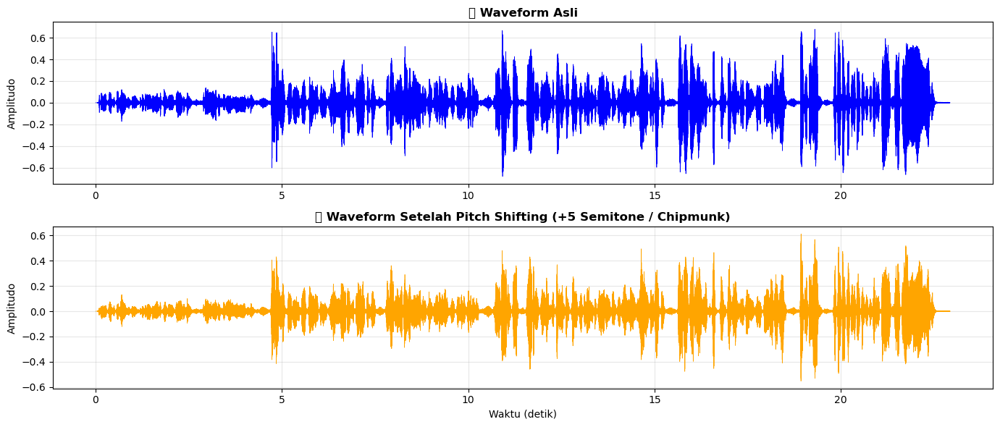

C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\1631957582.py:57: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


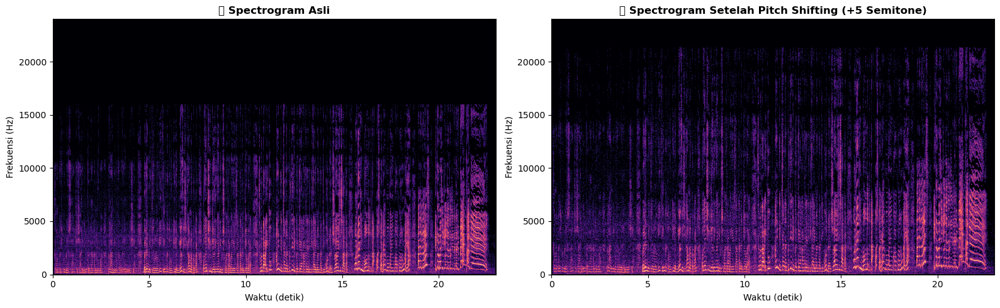

🔊 Original Audio:


🔊 Chipmunk Version (+5 Semitone):



💾 File chipmunk tersimpan sebagai: 'NoiseReduction_Chipmunk.wav'
🎵 Suara jadi lebih tinggi dan cepat seperti chipmunk!


In [38]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio, display

# === 1. Load audio rekaman kamu ===
audio_path = "Rekaman dan Analisis Suara Multi-Level.wav"
y, sr = librosa.load(audio_path, sr=48000)

print(f"🎧 Audio berhasil dimuat: {len(y):,} samples @ {sr:,} Hz")

# === 2. Lakukan pitch shifting untuk efek chipmunk (+5 semitone) ===
y_chipmunk = librosa.effects.pitch_shift(y, sr=sr, n_steps=+5)
y_chipmunk = librosa.effects.pitch_shift(y, sr=sr, n_steps=+5)

print("✅ Pitch shifting selesai! (suara chipmunk)")

# === 3. Visualisasi waveform sebelum & sesudah shifting ===
fig, axes = plt.subplots(2, 1, figsize=(14, 6))

# Waveform original
t = np.linspace(0, len(y)/sr, len(y))
axes[0].plot(t, y, color='blue', linewidth=0.5)
axes[0].set_title("🎙️ Waveform Asli", fontweight='bold')
axes[0].set_ylabel("Amplitudo")
axes[0].grid(True, alpha=0.3)

# Waveform chipmunk
t2 = np.linspace(0, len(y_chipmunk)/sr, len(y_chipmunk))
axes[1].plot(t2, y_chipmunk, color='orange', linewidth=0.5)
axes[1].set_title("🐿️ Waveform Setelah Pitch Shifting (+5 Semitone / Chipmunk)", fontweight='bold')
axes[1].set_xlabel("Waktu (detik)")
axes[1].set_ylabel("Amplitudo")
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# === 4. Visualisasi spectrogram sebelum & sesudah shifting ===
fig, axes = plt.subplots(1, 2, figsize=(16, 5))

# Spectrogram original
D_orig = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D_orig, sr=sr, x_axis='time', y_axis='hz', ax=axes[0])
axes[0].set_title("📊 Spectrogram Asli", fontweight='bold')
axes[0].set_xlabel("Waktu (detik)")
axes[0].set_ylabel("Frekuensi (Hz)")

# Spectrogram chipmunk
D_chip = librosa.amplitude_to_db(np.abs(librosa.stft(y_chipmunk)), ref=np.max)
librosa.display.specshow(D_chip, sr=sr, x_axis='time', y_axis='hz', ax=axes[1])
axes[1].set_title("📊 Spectrogram Setelah Pitch Shifting (+5 Semitone)", fontweight='bold')
axes[1].set_xlabel("Waktu (detik)")
axes[1].set_ylabel("Frekuensi (Hz)")

plt.tight_layout()
plt.show()

# === 5. Dengar hasilnya ===
print("🔊 Original Audio:")
display(Audio(y, rate=sr))

print("🔊 Chipmunk Version (+5 Semitone):")
display(Audio(y_chipmunk, rate=sr))

# === 6. Simpan hasil audio chipmunk ===
import soundfile as sf
sf.write("NoiseReduction_Chipmunk.wav", y_chipmunk, sr)

print("\n💾 File chipmunk tersimpan sebagai: 'NoiseReduction_Chipmunk.wav'")
print("🎵 Suara jadi lebih tinggi dan cepat seperti chipmunk!")


**Jelaskan proses pitch shifting yang Anda lakukan, termasuk:** 

1. Parameter yang digunakan : Pitch Shifting dilakukan dalam soal ini, nilai paramaternya n_stepas diatur ke +5 semitone, yang dimana berarti nada suara dinaikkan sebanyak 5 semitone

2. Perbedaan dalam representasi visual antara suara asli dan suara yang telah dimodifikasi : 
- Waveform :
    Suara Asli : Memiliki bentuk gelombang yang lebih rendah dan lebih lebar, menunjukkan amplitudo yang lebih besar pada frekuensi rendah

    Suara Chipmunk : etelah pitch shifting, waveform menjadi lebih tinggi dan lebih sempit, menunjukkan bahwa amplitudo pada frekuensi tinggi meningkat

- Spectogram :
    Suara Asli : Menunjukkan distribusi frekuensi yang lebih merata di seluruh rentang frekuensi, dengan konsentrasi energi di frekuensi rendah.

    Suara Chipmunk : Menunjukkan peningkatan energi/kenaikan di frekuensi tinggi, dengan pola yang lebih terfokus pada frekuensi yang lebih tinggi, mencerminkan perubahan nada yang lebih tinggi

3. Bagaimana perubahan pitch memengaruhi kualitas dan kejelasan suara : Setelah proses pitch shifting, suara terdengar lebih tinggi dan cepat, mirip dengan suara chipmunk. Kualitas suara tetap terjaga, tetapi kejelasan ucapan mungkin sedikit berkurang karena peningkatan frekuensi. Suara yang lebih tinggi dapat membuat beberapa detail menjadi lebih sulit didengar, tetapi secara keseluruhan, efek ini memberikan karakter yang unik pada suara.

 **Gunakan dua buah pitch tinggi, misalnya pitch +7 dan pitch +12**

🎧 Audio berhasil dimuat: 1,100,800 samples @ 48,000 Hz


✅ Pitch shifting selesai untuk +7 dan +12 semitone!


Text(0.5, 1.0, '🐿️🐿️ Waveform Super Chipmunk (+12 Semitone)')

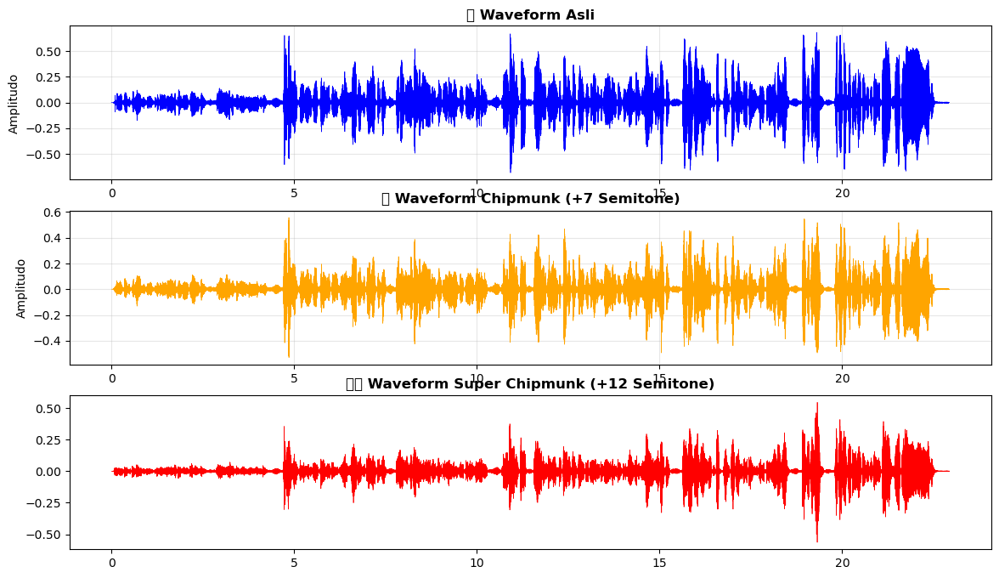

In [39]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio, display
import soundfile as sf

# === 1. Load audio rekaman kamu ===
audio_path = "Rekaman dan Analisis Suara Multi-Level.wav"
y, sr = librosa.load(audio_path, sr=48000)
print(f"🎧 Audio berhasil dimuat: {len(y):,} samples @ {sr:,} Hz")

# === 2. Pitch shifting ke dua level berbeda ===
y_chipmunk_7 = librosa.effects.pitch_shift(y, sr=sr, n_steps=+7)   # agak tinggi
y_chipmunk_12 = librosa.effects.pitch_shift(y, sr=sr, n_steps=+12) # super tinggi

print("✅ Pitch shifting selesai untuk +7 dan +12 semitone!")

# === 3. Visualisasi waveform (asli, +7, +12) ===
fig, axes = plt.subplots(3, 1, figsize=(14, 8))

# Original
t = np.linspace(0, len(y)/sr, len(y))
axes[0].plot(t, y, color='blue', linewidth=0.5)
axes[0].set_title("🎙️ Waveform Asli", fontweight='bold')
axes[0].set_ylabel("Amplitudo")
axes[0].grid(True, alpha=0.3)

# +7 semitone
t7 = np.linspace(0, len(y_chipmunk_7)/sr, len(y_chipmunk_7))
axes[1].plot(t7, y_chipmunk_7, color='orange', linewidth=0.5)
axes[1].set_title("🐿️ Waveform Chipmunk (+7 Semitone)", fontweight='bold')
axes[1].set_ylabel("Amplitudo")
axes[1].grid(True, alpha=0.3)

# +12 semitone
t12 = np.linspace(0, len(y_chipmunk_12)/sr, len(y_chipmunk_12))
axes[2].plot(t12, y_chipmunk_12, color='red', linewidth=0.5)
axes[2].set_title("🐿️🐿️ Waveform Super Chipmunk (+12 Semitone)", fontweight='bold')

In [40]:
import librosa
import soundfile as sf
import numpy as np

# 1️⃣ Load rekaman asli
y, sr = librosa.load("Rekaman dan Analisis Suara Multi-Level.wav", sr=None)

# 2️⃣ Lakukan pitch shifting
y_pitch7 = librosa.effects.pitch_shift(y, sr=sr, n_steps=7)
y_pitch12 = librosa.effects.pitch_shift(y, sr=sr, n_steps=12)

# 3️⃣ Samakan panjang sinyal biar bisa digabung
min_len = min(len(y_pitch7), len(y_pitch12))
y_pitch7 = y_pitch7[:min_len]
y_pitch12 = y_pitch12[:min_len]

# 4️⃣ Gabungkan (misal dibuat jadi efek dua suara bersamaan)
y_combined = 0.5 * (y_pitch7 + y_pitch12)

# 5️⃣ Simpan hasil gabungan
sf.write("Rekaman_Chipmunk_Combined.wav", y_combined, sr)

print("✅ Rekaman chipmunk gabungan (+7 & +12 semitones) berhasil dibuat!")


✅ Rekaman chipmunk gabungan (+7 & +12 semitones) berhasil dibuat!


In [41]:
!pip install pydub
!apt-get install ffmpeg -y


'apt-get' is not recognized as an internal or external command,
operable program or batch file.


# **Soal 4 : Audio Processing Chain** #

**Equalizer (EQ)**

In [42]:
from pydub import AudioSegment, effects

audio = AudioSegment.from_file("Rekaman Chipmunk.wav")

# EQ sederhana: potong bawah (low cut) dan sedikit boost high
audio = audio.low_pass_filter(8000)   # hanya biarkan frekuensi di bawah 8kHz
audio = audio.high_pass_filter(200)   # hilangkan noise rendah di bawah 200Hz


**Gain/Fade**

In [43]:
audio = audio.apply_gain(+3)          # tambah volume 3 dB
audio = audio.fade_in(500).fade_out(800)  # 0.5 detik masuk, 0.8 detik keluar


**Normalization**

In [44]:
audio = effects.normalize(audio)

**Compression**

In [45]:
import numpy as np
samples = np.array(audio.get_array_of_samples())
compressed = np.sign(samples) * (np.abs(samples) ** 0.8)  # ringan
audio = audio._spawn(compressed.astype(samples.dtype).tobytes())


**Noise Gate**

In [46]:
threshold = audio.dBFS - 25  # ambang noise
audio = effects.strip_silence(audio, silence_thresh=threshold, padding=100)

**Silence Trimming**

In [47]:
trimmed = effects.strip_silence(audio, silence_thresh=-40)
trimmed.export("Rekaman_Chipmunk_Processed.wav", format="wav")


<_io.BufferedRandom name='Rekaman_Chipmunk_Processed.wav'>

In [49]:
!pip install pyloudnorm



   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   ---------------------------------------- 0/2 [future]
   -------------------- ------------------- 1/2 [pyloudnorm]
   ---------------------------------------- 2/2 [pyloudnorm]



🔊 Loudness sebelum normalisasi: -22.45 LUFS
✅ Loudness sesudah normalisasi: -16.00 LUFS


c:\Users\Asus\miniconda3\envs\multimedia\Lib\site-packages\pyloudnorm\normalize.py:62: UserWarning: Possible clipped samples in output.
  warnings.warn("Possible clipped samples in output.")


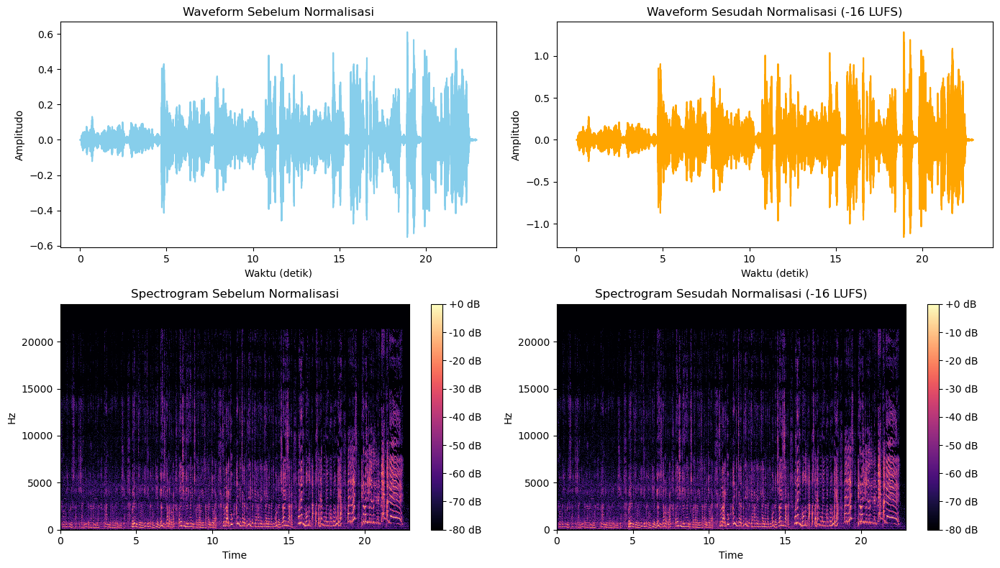


🎧 Normalisasi selesai! Bandingkan perbedaan tingkat kekerasan suaranya.


In [50]:
import librosa
import pyloudnorm as pyln
import matplotlib.pyplot as plt
import librosa.display
import numpy as np

# === 1. Load audio ===
y, sr = librosa.load("Rekaman Chipmunk.wav", sr=None)

# === 2. Hitung loudness awal ===
meter = pyln.Meter(sr)  # buat loudness meter
loudness_before = meter.integrated_loudness(y)
print(f"🔊 Loudness sebelum normalisasi: {loudness_before:.2f} LUFS")

# === 3. Normalisasi ke -16 LUFS ===
target_loudness = -16.0
y_normalized = pyln.normalize.loudness(y, loudness_before, target_loudness)

# Hitung ulang loudness setelah normalisasi
loudness_after = meter.integrated_loudness(y_normalized)
print(f"✅ Loudness sesudah normalisasi: {loudness_after:.2f} LUFS")

# === 4. Visualisasi Waveform dan Spectrogram ===

fig, axes = plt.subplots(2, 2, figsize=(14, 8))

# Waveform sebelum
t = np.linspace(0, len(y)/sr, len(y))
axes[0, 0].plot(t, y, color='skyblue')
axes[0, 0].set_title("Waveform Sebelum Normalisasi")
axes[0, 0].set_xlabel("Waktu (detik)")
axes[0, 0].set_ylabel("Amplitudo")

# Waveform sesudah
t2 = np.linspace(0, len(y_normalized)/sr, len(y_normalized))
axes[0, 1].plot(t2, y_normalized, color='orange')
axes[0, 1].set_title("Waveform Sesudah Normalisasi (-16 LUFS)")
axes[0, 1].set_xlabel("Waktu (detik)")
axes[0, 1].set_ylabel("Amplitudo")

# Spectrogram sebelum
D_before = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
img1 = librosa.display.specshow(D_before, sr=sr, x_axis='time', y_axis='hz', ax=axes[1, 0])
axes[1, 0].set_title("Spectrogram Sebelum Normalisasi")
plt.colorbar(img1, ax=axes[1, 0], format="%+2.0f dB")

# Spectrogram sesudah
D_after = librosa.amplitude_to_db(np.abs(librosa.stft(y_normalized)), ref=np.max)
img2 = librosa.display.specshow(D_after, sr=sr, x_axis='time', y_axis='hz', ax=axes[1, 1])
axes[1, 1].set_title("Spectrogram Sesudah Normalisasi (-16 LUFS)")
plt.colorbar(img2, ax=axes[1, 1], format="%+2.0f dB")

plt.tight_layout()
plt.show()

print("\n🎧 Normalisasi selesai! Bandingkan perbedaan tingkat kekerasan suaranya.")


 Jelaskan:
 
 1. Perubahan dinamika suara yang terjadi : Setelah normalisasi ke -16 LUFS,
gelombang suaranya (waveform kanan) jadi lebih rata dan stabil, nggak ada bagian yang terlalu pelan atau terlalu keras banget.
 
 2. Perbedaan antara normalisasi peak dan normalisasi LUFS : 
    Peak Normalization : Fokusnya ke titik suara paling tinggi

    LUFS Normalization : Kerasnya suara yang kita dengar
 
 3. Bagaimana kualitas suara berubah setelah proses normalisasi dan loudness
 optimization : Setelah di-normalisasi ke -16 LUFS, suara nya menjadi:
    Lebih jelas dan rata volumenya.
    Nggak terlalu pelan di bagian tertentu.
    Tapi juga nggak clipping (nggak pecah).
    Frekuensi suara utama tetap jelas, cuma level keseluruhannya jadi lebih Cleaning 
 
 4. Kelebihan dan kekurangan dari pengoptimalan loudness dalam konteks rekaman suara : 
 
   Kelebihan:

   Volume jadi stabil, enak didengar di berbagai perangkat (HP, laptop, speaker).

   Cocok buat konten publik (YouTube, Spotify, dll) karena standarnya memang sekitar -16 LUFS.

   Kualitas suara terasa lebih clean.

   Kekurangan:

   Kadang detail halus (seperti napas kecil atau ambience) jadi agak ketutup.

   Kalau terlalu dipaksa, bisa kehilangan dinamika asli  semua bagian kedengarannya flat. 


# **Soal 5: Music Analysis dan Remix** #

**Deteksi Tempo dan Estimasi Kunci**

In [53]:
import librosa

# Load lagu
banda, sr_banda = librosa.load("Banda-neira.wav")
satu, sr_satu = librosa.load("Satu-Mimpiku.wav")

# Tempo (BPM)
tempo_banda, _ = librosa.beat.beat_track(y=banda, sr=sr_banda)
tempo_satu, _ = librosa.beat.beat_track(y=satu, sr=sr_satu)

print("Tempo Banda Neira:", tempo_banda)
print("Tempo Satu Mimpiku:", tempo_satu)

# Estimasi Key
chroma_banda = librosa.feature.chroma_cens(y=banda, sr=sr_banda)
chroma_satu = librosa.feature.chroma_cens(y=satu, sr=sr_satu)

import numpy as np
key_banda = np.argmax(np.mean(chroma_banda, axis=1))
key_satu = np.argmax(np.mean(chroma_satu, axis=1))

print("Key Banda Neira:", key_banda)
print("Key Satu Mimpiku:", key_satu)


Tempo Banda Neira: [117.45383523]
Tempo Satu Mimpiku: [99.38401442]
Key Banda Neira: 2
Key Satu Mimpiku: 4


**Analisis singkatnya** 

1. Banda Neira – Sampai Jadi Debu punya tempo sekitar 117 BPM. Meskipun temponya lumayan sedang, feel-nya tetap terasa melankolis dan tenang, karena aransemen serta vokalnya yang lembut,

2. Anjelia Dom – Satu Mimpiku temponya lebih cepat (99 BPM), jadi nuansanya terasa ceria, dn penuh semangat


**Time Stretch (samakan tempo)**

In [66]:
# --- 3. Time Stretch: Samakan tempo kedua lagu
target_bpm = 100  # bisa kamu ubah sesuai selera

banda_stretch = librosa.effects.time_stretch(banda_neira, rate=target_bpm/float(tempo_banda))
satu_stretch = librosa.effects.time_stretch(satu_mimpiku, rate=target_bpm/float(tempo_satu))

print("✅ Tempo kedua lagu disamakan.")


C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\58562340.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  banda_stretch = librosa.effects.time_stretch(banda_neira, rate=target_bpm/float(tempo_banda))
C:\Users\Asus\AppData\Local\Temp\ipykernel_14984\58562340.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  satu_stretch = librosa.effects.time_stretch(satu_mimpiku, rate=target_bpm/float(tempo_satu))


✅ Tempo kedua lagu disamakan.


**Pitch Shift**

In [68]:
# --- 5. Pitch Shift: Samakan key
n_steps = key_satu - key_banda  # selisih nada antar lagu

# Pastikan semuanya dalam bentuk keyword argument
banda_shift = librosa.effects.pitch_shift(
    y=banda_stretch, 
    sr=sr_banda, 
    n_steps=n_steps
)

print(f"✅ Pitch Banda Neira digeser sebanyak {n_steps:+.2f} semitone agar sesuai dengan Satu Mimpiku.")


✅ Pitch Banda Neira digeser sebanyak +2.00 semitone agar sesuai dengan Satu Mimpiku.


**Crossfading: Gabungkan kedua lagu dengan transisi halus**

In [69]:
crossfade_duration = 5  # detik
crossfade_len = int(sr_banda * crossfade_duration)

# pastikan panjang lagu cukup dan sama
min_len = min(len(banda_shift), len(satu_stretch))
banda_shift = banda_shift[:min_len]
satu_stretch = satu_stretch[:min_len]

# buat fade in/out
fade_out = np.linspace(1, 0, crossfade_len)
fade_in = np.linspace(0, 1, crossfade_len)

# gabungkan dengan efek crossfade
mix = np.concatenate([
    banda_shift[:-crossfade_len] * 0.8,
    banda_shift[-crossfade_len:] * fade_out + satu_stretch[:crossfade_len] * fade_in,
    satu_stretch[crossfade_len:]
])

print("✅ Crossfade berhasil diterapkan.")

✅ Crossfade berhasil diterapkan.


In [71]:
import soundfile as sf

# Simpan hasil remix (tanpa filter tambahan)
sf.write("remix_banda_satu.wav", mix, sr_banda)
print("🎶 Remix selesai! File disimpan sebagai remix_banda_satu.wav")


🎶 Remix selesai! File disimpan sebagai remix_banda_satu.wav


**Waveform dan Spectogram**

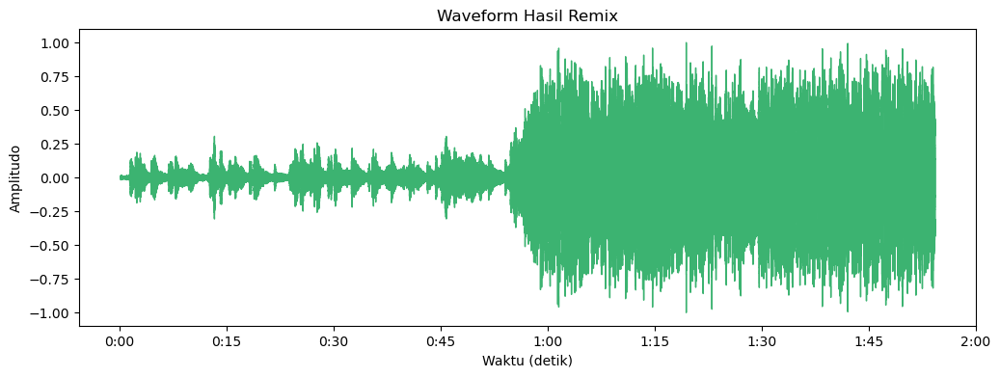

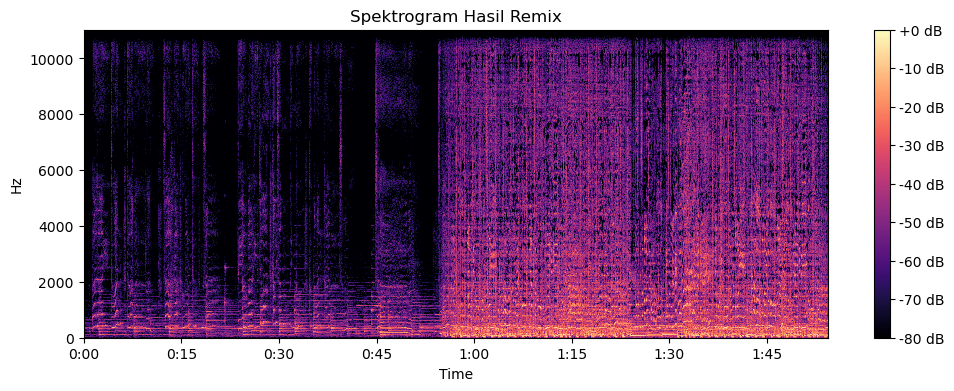

In [72]:
import matplotlib.pyplot as plt
import librosa.display

# --- Load ulang hasil remix biar lebih aman (pastikan file sudah tersimpan)
y_remix, sr_remix = librosa.load("Mixed Banda dan Satu.wav", sr=None)

# --- 1. Plot Waveform
plt.figure(figsize=(12, 4))
librosa.display.waveshow(y_remix, sr=sr_remix, color='mediumseagreen')
plt.title("Waveform Hasil Remix")
plt.xlabel("Waktu (detik)")
plt.ylabel("Amplitudo")
plt.show()

# --- 2. Plot Spektrogram
plt.figure(figsize=(12, 4))
D = librosa.amplitude_to_db(np.abs(librosa.stft(y_remix)), ref=np.max)
librosa.display.specshow(D, sr=sr_remix, x_axis='time', y_axis='hz', cmap='magma')
plt.title("Spektrogram Hasil Remix")
plt.colorbar(format="%+2.0f dB")
plt.show()


Hasil yang dilakukan dari waveform dan spectogram bisa dilihat di 

Bagian Awal (0:00 – 1:00)

- Gelombangnya kecil dan rapat → ini bagian lagu Banda Neira yang nuansanya lebih pelan dan lembut.

- Amplitudo kecil artinya volumenya lebih tenang, cocok sama karakter sedih/lambatnya.

- Di spektrogram juga kelihatan frekuensinya lebih rendah dan tipis, dominan di bawah 2000 Hz, menandakan suara lembut dan minim instrumen keras.

2. Bagian tengah ke akhir (sekitar 1:00 – 2:00)

- Waveform langsung lebih besar dan padat → masuk ke lagu Satu Mimpiku yang ceria dan cepat.

- Spektrogram-nya juga makin terang dan penuh, terutama di frekuensi menengah–tinggi (2000–10000 Hz) karena banyak instrumen dan ritme cepat.

3. Transisi di tengah (crossfade)
- Sekitar menit ke-1 ada perubahan bertahap dari halus ke ramai ini efek crossfading, bikin perpindahan antar lagu jadi mulus, nggak tiba-tiba.